### Gaussian Processes Practical Demonstration
https://www.youtube.com/watch?v=V1bF37-_ytQ

In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI1 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI1")

In [3]:
# Menampilkan 5 Data pertama DKI1
DKI1

,Tanggal,Wilayah,PM10,SO2,CO,O3,NO2,Max,Critical,Kategori
0,2017-01-01,DKI1 (Bunderan HI),0.719512,0.314286,0.458333,0.092308,0.012821,0.300518,PM10,Sedang
1,2017-01-02,DKI1 (Bunderan HI),0.146341,0.295238,0.270833,0.082051,0.000000,0.139896,SO2,Baik
2,2017-01-03,DKI1 (Bunderan HI),0.170732,0.295238,0.291667,0.087179,0.012821,0.139896,SO2,Baik
3,2017-01-04,DKI1 (Bunderan HI),0.243902,0.295238,0.395833,0.087179,0.012821,0.139896,SO2,Baik
4,2017-01-05,DKI1 (Bunderan HI),0.304878,0.295238,0.458333,0.056410,0.012821,0.139896,SO2,Baik
...,...,...,...,...,...,...,...,...,...,...
1760,2021-10-27,DKI1 (Bunderan HI),0.621951,0.266667,0.250000,0.097436,0.487179,0.367876,PM25,SEDANG
1761,2021-10-28,DKI1 (Bunderan HI),0.573171,0.257143,0.270833,0.097436,0.487179,0.331606,PM25,SEDANG
1762,2021-10-29,DKI1 (Bunderan HI),0.560976,0.285714,0.333333,0.076923,0.435897,0.305699,PM25,SEDANG
1763,2021-10-30,DKI1 (Bunderan HI),0.536585,0.285714,0.187500,0.112821,0.500000,0.326425,PM25,SEDANG


Train Test Data

In [4]:
# Predict 1 Bulan
train = DKI1.iloc[:-30]
test = DKI1.iloc[-30:]

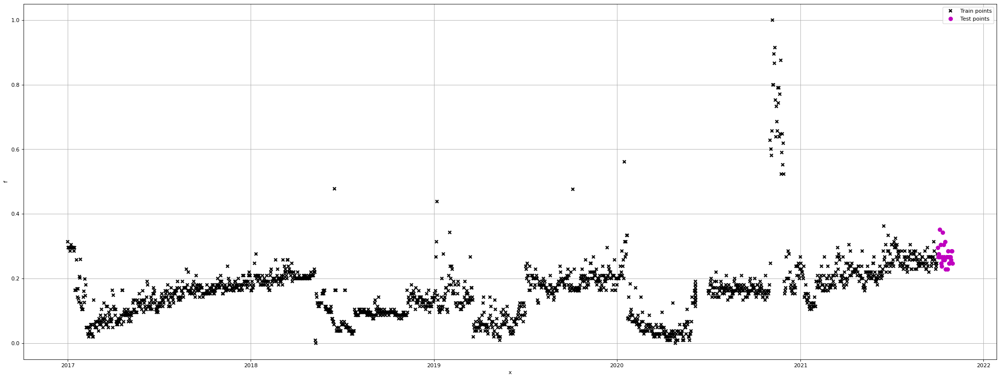

In [6]:
train_X, train_Y = np.array(train.index).reshape(-1, 1), np.array(train['SO2']).reshape(-1, 1)
test_X, test_Y = np.array(test.index).reshape(-1, 1), np.array(test['SO2']).reshape(-1, 1)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI1['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

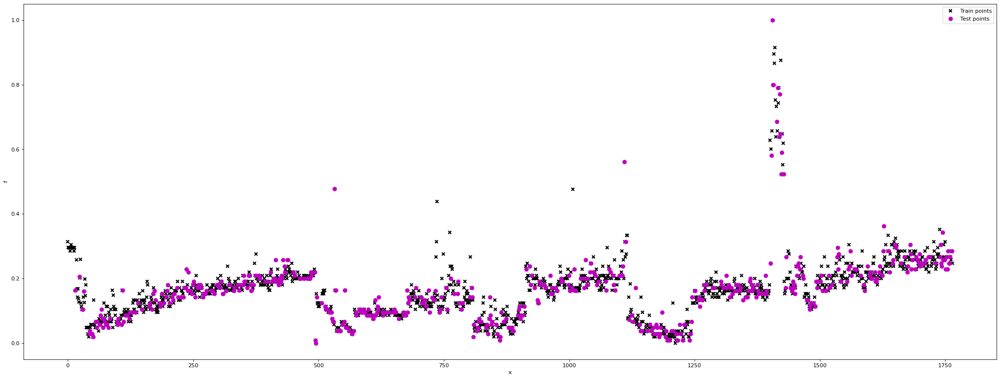

In [24]:
X = np.array(list(range(0,1765)))
# x = np.array(DKI1['Tanggal'])
X = X.reshape(-1,1)
Y = np.array(DKI1['SO2'])
Y = Y.reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.3, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(train_X, train_Y, "kx", mew=2, label='Train points')
plt.plot(test_X, test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.legend()

#### RBF Kernel
Optimizing kernel parameters

In [7]:
k1 = GPy.kern.RBF(1)
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
m1.optimize()

In [8]:
m1

GP_regression.,value,constraints,priors
rbf.variance,0.02189783930586905,+ve,
rbf.lengthscale,8.452040916671223,+ve,
Gaussian_noise.variance,0.0011046869564678987,+ve,


In [14]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [10]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')

In [11]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.1907678890856601
MSE: 0.0420191225537471
RMSE: 0.20498566426398482
R2 Square -49.87051531717379
__________________________________


In [12]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.9043588857467657

In [13]:
data_test = pd.DataFrame(test_Y.flatten(), columns=['Data Test'])
prediksi = pd.DataFrame(m1.predict(test_X)[0].flatten(), columns=['Prediksi'])
selisih = abs(test_Y.flatten() - m1.predict(test_X)[0].flatten())
selisih = pd.DataFrame(selisih, columns=['Selisih'])
pd.concat([data_test, prediksi, selisih], axis=1, join='inner')

,Data Test,Prediksi,Selisih
0,0.295238,0.233022,0.062216
1,0.266667,0.224078,0.042589
2,0.276190,0.214060,0.062130
3,0.266667,0.203014,0.063653
4,0.352381,0.191015,0.161366
5,0.266667,0.178179,0.088488
6,0.304762,0.164660,0.140102
7,0.247619,0.150648,0.096971
8,0.238095,0.136366,0.101729
9,0.266667,0.122054,0.144612


Periodic kernel

In [30]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize()

In [31]:
m2

GP_regression.,value,constraints,priors
std_periodic.variance,1.0439954885618365,+ve,
std_periodic.period,1.9969441077037233,+ve,
std_periodic.lengthscale,0.6428491371122946,+ve,
Gaussian_noise.variance,0.007296953287851491,+ve,


In [32]:
m2.plot()
ax = plt.gca()
plt.rc('figure', figsize=(64, 24), dpi=240)
ax.plot(test_X, test_Y, "mo", mew=2, label='Test points')

ax.legend()

In [33]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.05685153194303102
MSE: 0.010139807278933476
RMSE: 0.10069661006674195
R2 Square 0.17410252034252194
__________________________________


Kombinasi 2 Kernel

In [34]:
k3 = k1+k2
k4 = k1*k2

In [35]:
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize()
m3

GP_regression.,value,constraints,priors
sum.rbf.variance,0.007181115029488154,+ve,
sum.rbf.lengthscale,6.19869111501981,+ve,
sum.std_periodic.variance,0.7867588654768644,+ve,
sum.std_periodic.period,0.45717349598373924,+ve,
sum.std_periodic.lengthscale,1.7784061598501026,+ve,
Gaussian_noise.variance,0.0008407789567218273,+ve,


In [36]:
m3.plot()
ax = plt.gca()
plt.rc('figure', figsize=(64, 24), dpi=240)
ax.plot(test_X, test_Y, "mo", mew=2, label='Test points')

ax.legend()

In [37]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.02381655247415448
MSE: 0.0017724663468003808
RMSE: 0.042100669196586185
R2 Square 0.8556308371223693
__________________________________


In [38]:
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize()
m4

GP_regression.,value,constraints,priors
mul.rbf.variance,0.020942683455917082,+ve,
mul.rbf.lengthscale,7.907829024140641,+ve,
mul.std_periodic.variance,1.1274478565146409,+ve,
mul.std_periodic.period,2.6012367689306175,+ve,
mul.std_periodic.lengthscale,27.294810279902563,+ve,
Gaussian_noise.variance,0.0008797915815925597,+ve,


In [39]:
m4.plot()
ax = plt.gca()
plt.rc('figure', figsize=(64, 24), dpi=240)
ax.plot(test_X, test_Y, "mo", mew=2, label='Test points')

ax.legend()

In [40]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.023537878428201302
MSE: 0.0017483801378156824
RMSE: 0.04181363578804984
R2 Square 0.8575926830182272
__________________________________
